<a href="https://colab.research.google.com/github/khanifk/mysite/blob/master/LDA_Time_Series_Covid19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [14]:
!pip install watermark

In [15]:
%matplotlib inline
%load_ext watermark
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

import pandas as pd
import numpy as np
import scipy as sp
import sklearn
import sys
from tqdm import tqdm
import nltk
import seaborn as sns
from nltk.stem import WordNetLemmatizer
from nltk.stem import WordNetLemmatizer as lemm, SnowballStemmer as stemm
from nltk.stem.porter import *
from nltk.corpus import stopwords
import gensim
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import ldamodel
from gensim.models.ldamodel import LdaModel
from gensim.models import Phrases
from gensim.models.wrappers import LdaMallet
import gensim.corpora;
from gensim.corpora.dictionary import Dictionary
from gensim import corpora, models
from gensim.utils import simple_preprocess
#import pyLDAvis.gensim_models; pyLDAvis.enable_notebook()
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.decomposition import LatentDirichletAllocation
from statsmodels.tsa.stattools import grangercausalitytests
from operator import itemgetter
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.preprocessing import normalize
from sklearn.utils import check_random_state
from sklearn.decomposition._online_lda_fast import _dirichlet_expectation_2d
import tensorflow as tf
from tensorflow import keras 
from keras.layers import Dense, LSTM
#import pyLDAvis.sklearn
#from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary
#from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import pickle, string, re, time, os, io
from pprint import pprint
import base64
from io import BytesIO
import warnings
warnings.filterwarnings('ignore')
sns.set_context('poster')

%watermark -a 'Hanif' -d -t -v -p numpy,pandas,matplotlib,plotly,gensim,nltk,sklearn,keras,tensorflow

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Author: Hanif

Python implementation: CPython
Python version       : 3.7.11
IPython version      : 5.5.0

numpy     : 1.19.5
pandas    : 1.1.5
matplotlib: 3.2.2
plotly    : 4.4.1
gensim    : 3.6.0
nltk      : 3.2.5
sklearn   : 0.0
keras     : 2.6.0
tensorflow: 2.6.0



In [16]:
# # Loading the data
start = time.time()
data = pd.read_csv(r"covid.csv", error_bad_lines=True)
print(start)
print(data)

1629772766.2383704
      conversation_id       date  ... likes_count                       hashtags
0        1.280000e+18   7/7/2020  ...           0           ['#rapidtestcorona']
1        1.280000e+18   7/7/2020  ...           0                             []
2        1.280000e+18   7/7/2020  ...           0                     ['#dprri']
3        1.280000e+18   7/7/2020  ...           0                             []
4        1.280000e+18   7/7/2020  ...           2                             []
...               ...        ...  ...         ...                            ...
9280     1.280000e+18  7/20/2020  ...           0                             []
9281     1.280000e+18  7/20/2020  ...           2  ['#monitorday', '#kopipahit']
9282     1.280000e+18  7/20/2020  ...           0                             []
9283     1.280000e+18  7/20/2020  ...           3                             []
9284     1.280000e+18  7/20/2020  ...          28                             []

[9285 ro

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9285 entries, 0 to 9284
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   conversation_id  9285 non-null   float64
 1   date             9285 non-null   object 
 2   time             9285 non-null   object 
 3   user_id          9285 non-null   float64
 4   username         9285 non-null   object 
 5   tweet            9285 non-null   object 
 6   mentions         9285 non-null   object 
 7   replies_count    9285 non-null   int64  
 8   retweets_count   9285 non-null   int64  
 9   likes_count      9285 non-null   int64  
 10  hashtags         9285 non-null   object 
dtypes: float64(2), int64(3), object(6)
memory usage: 798.1+ KB


In [18]:
list_tweet = list(data.tweet)

In [19]:
list_tweet

['Sandiaga Uno mengungkapkan pihaknya bersama EP For Jokowi berkomitmen tinggi untuk membantu pemerintah dalam upaya memutus mata rantai penyebaran COVID-19 lewat rapid test. #rapidtestcorona https://m.jpnn.com/news/sandiaga-uno-gelar-rapid-test-di-sarinah-bersama-sukarelawan-ep-jokowi\xa0…',
 'Pemerintah Jawa Timur Kolaborasi dengan Kedutaan Inggris Mengatasi\xa0Covid-19  https://kabarrakyat.id/pemerintah-jawa-timur-kolaborasi-dengan-kedutaan-inggris-mengatasi-covid-19/\xa0…',
 'Anggota Komisi IV DPR RI, Andi Akmal Pasluddin menilai Pemerintah belum cukup turun tangan pada penyelamatan kehidupan petani di masa pandemi covid-19 yang hingga saat ini masih berlangsung.  #DPRRI https://m.jpnn.com/news/andi-akmal-dpr-pemerintah-belum-efektif-selamatkan-nasib-petani-di-masa-pandemi\xa0…',
 '"Warga Kota Juang (Bireuen) yang terkonfirmasi positif terinfeksi virus corona itu dirilis sebagai pasien 88 COVID-19 Aceh," ujar Juru Bicara Gugus Tugas Percepatan Penanganan COVID-19 Pemerintah Aceh, S

In [20]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

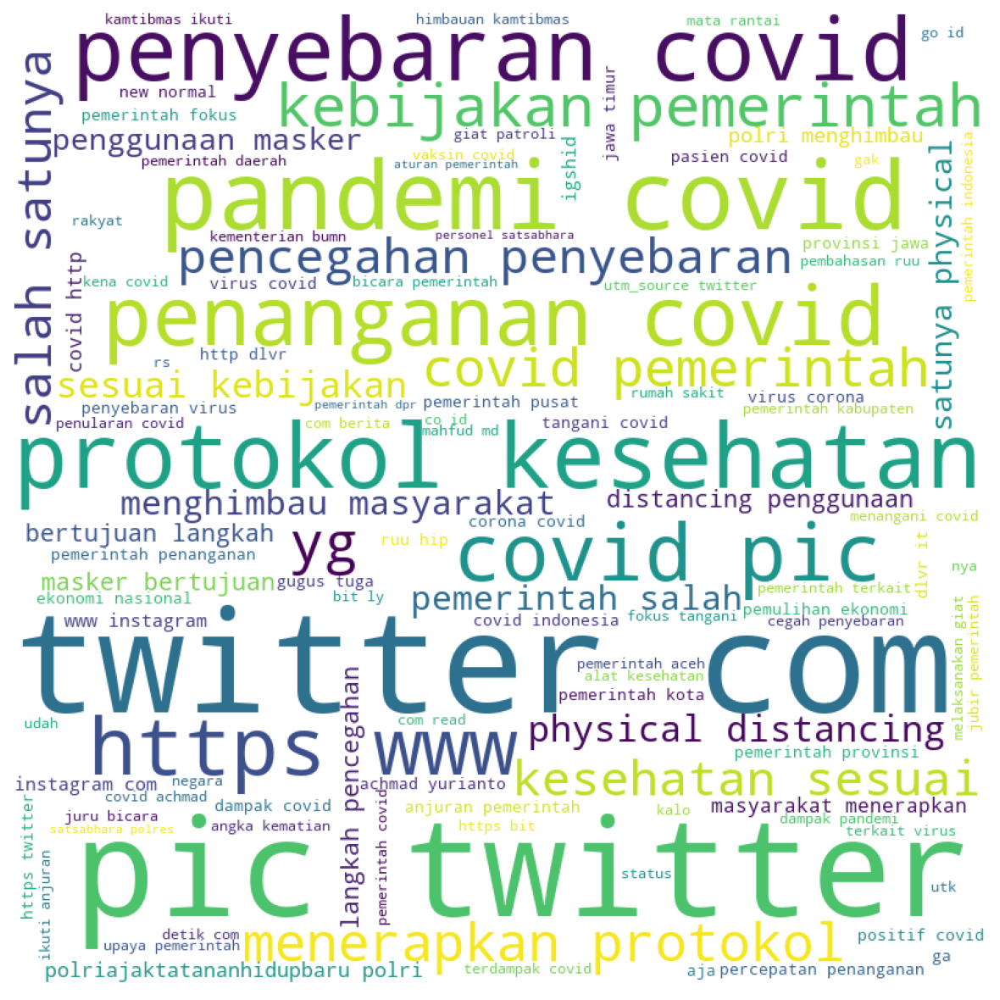

In [21]:
comment_words = ''
stops = set(stopwords.words('indonesian')) #NLTK
 
# iterate through the csv file
for val in data.tweet:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stops,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [22]:
print(stopwords.words('indonesian'))

['ada', 'adalah', 'adanya', 'adapun', 'agak', 'agaknya', 'agar', 'akan', 'akankah', 'akhir', 'akhiri', 'akhirnya', 'aku', 'akulah', 'amat', 'amatlah', 'anda', 'andalah', 'antar', 'antara', 'antaranya', 'apa', 'apaan', 'apabila', 'apakah', 'apalagi', 'apatah', 'artinya', 'asal', 'asalkan', 'atas', 'atau', 'ataukah', 'ataupun', 'awal', 'awalnya', 'bagai', 'bagaikan', 'bagaimana', 'bagaimanakah', 'bagaimanapun', 'bagi', 'bagian', 'bahkan', 'bahwa', 'bahwasanya', 'baik', 'bakal', 'bakalan', 'balik', 'banyak', 'bapak', 'baru', 'bawah', 'beberapa', 'begini', 'beginian', 'beginikah', 'beginilah', 'begitu', 'begitukah', 'begitulah', 'begitupun', 'bekerja', 'belakang', 'belakangan', 'belum', 'belumlah', 'benar', 'benarkah', 'benarlah', 'berada', 'berakhir', 'berakhirlah', 'berakhirnya', 'berapa', 'berapakah', 'berapalah', 'berapapun', 'berarti', 'berawal', 'berbagai', 'berdatangan', 'beri', 'berikan', 'berikut', 'berikutnya', 'berjumlah', 'berkali-kali', 'berkata', 'berkehendak', 'berkeinginan'

In [23]:
#We only need the Headlines_text column from the data
data_text = data[['tweet']]
datanggal = data[['date']]
data_tgl = np.unique(np.array([ii[:10] for ii in datanggal['date']]))
print(data_text)
print(data_tgl)

                                                  tweet
0     Sandiaga Uno mengungkapkan pihaknya bersama EP...
1     Pemerintah Jawa Timur Kolaborasi dengan Keduta...
2     Anggota Komisi IV DPR RI, Andi Akmal Pasluddin...
3     "Warga Kota Juang (Bireuen) yang terkonfirmasi...
4     Meski Kembali Zona Kuning Covid-19, Pemkot Kla...
...                                                 ...
9280  Ps. Kasi Humas Bripka Erwan Subagiyo pimpin pe...
9281  Masih Tingginya Kasus Covid-19, MPR Nilai Peme...
9282  Kalo lo masi pake masker ga di cuci ama gapuny...
9283  Untuk menuju Kabupaten Aceh Selatan kembali ke...
9284  Keluyurann keluar rmh pdhal bkn krn buat kerja...

[9285 rows x 1 columns]
['7/15/2020' '7/2/2020' '7/20/2020' '7/21/2020' '7/22/2020' '7/3/2020'
 '7/4/2020' '7/5/2020' '7/6/2020' '7/7/2020']


In [24]:
# We need to remove stopwords first. Casting all values to float will make it easier to iterate over.
data_text = data_text.astype('str')
print(data_text)

                                                  tweet
0     Sandiaga Uno mengungkapkan pihaknya bersama EP...
1     Pemerintah Jawa Timur Kolaborasi dengan Keduta...
2     Anggota Komisi IV DPR RI, Andi Akmal Pasluddin...
3     "Warga Kota Juang (Bireuen) yang terkonfirmasi...
4     Meski Kembali Zona Kuning Covid-19, Pemkot Kla...
...                                                 ...
9280  Ps. Kasi Humas Bripka Erwan Subagiyo pimpin pe...
9281  Masih Tingginya Kasus Covid-19, MPR Nilai Peme...
9282  Kalo lo masi pake masker ga di cuci ama gapuny...
9283  Untuk menuju Kabupaten Aceh Selatan kembali ke...
9284  Keluyurann keluar rmh pdhal bkn krn buat kerja...

[9285 rows x 1 columns]


In [25]:
for idx in range(len(data_text)):
    listing = []
    #go through each word in each data_text row, remove stopwords, and set them on the index.
    for word in data_text.iloc[idx]['tweet'].split(' '):
        if "http" not in word:
            if "@" not in word:
                if "#" not in word:                        
                    if word not in stopwords.words('indonesian'):
                        if word.isalpha():
                            if len(word) > 2:
                                listing.append(word)
    data_text.iloc[idx]['tweet'] = listing
    #print logs to monitor output
    if idx % 100 == 0:
        sys.stdout.write('\rc = ' + str(idx) + ' / ' + str(len(data_text)));

print(data_text)

c = 9200 / 9285                                                  tweet
0     [Sandiaga, Uno, For, Jokowi, berkomitmen, memb...
1     [Pemerintah, Jawa, Timur, Kolaborasi, Kedutaan...
2     [Anggota, Komisi, DPR, Andi, Akmal, Pasluddin,...
3     [Kota, Juang, terkonfirmasi, positif, terinfek...
4     [Meski, Kembali, Zona, Kuning, Pemkot, Klaim, ...
...                                                 ...
9280  [Kasi, Humas, Bripka, Erwan, Subagiyo, pimpin,...
9281  [Masih, Tingginya, Kasus, MPR, Nilai, Pemerint...
9282  [Kalo, masi, pake, masker, cuci, ama, gapunya,...
9283  [Untuk, Kabupaten, Aceh, Selatan, zona, hijau,...
9284  [Keluyurann, rmh, pdhal, bkn, krn, kerjaan, be...

[9285 rows x 1 columns]


In [26]:
#save data because it takes very long to remove stop words
pickle.dump(data_text, open('data_text.dat', 'wb'))

In [27]:
#get the words as an array for LDA input
train_komen = [value[0] for value in data_text.iloc[0:].values];
print('train_komen',train_komen)
print(len(train_komen))

train_komen [['Sandiaga', 'Uno', 'For', 'Jokowi', 'berkomitmen', 'membantu', 'pemerintah', 'upaya', 'memutus', 'mata', 'rantai', 'penyebaran', 'rapid'], ['Pemerintah', 'Jawa', 'Timur', 'Kolaborasi', 'Kedutaan', 'Inggris'], ['Anggota', 'Komisi', 'DPR', 'Andi', 'Akmal', 'Pasluddin', 'menilai', 'Pemerintah', 'turun', 'tangan', 'penyelamatan', 'kehidupan', 'petani', 'pandemi'], ['Kota', 'Juang', 'terkonfirmasi', 'positif', 'terinfeksi', 'virus', 'corona', 'dirilis', 'pasien', 'Juru', 'Bicara', 'Gugus', 'Tugas', 'Percepatan', 'Penanganan', 'Pemerintah'], ['Meski', 'Kembali', 'Zona', 'Kuning', 'Pemkot', 'Klaim', 'Pagaralam', 'Aman', 'Pemerintah', 'Kota', 'Sumatera', 'membuka', 'dunia', 'pariwisata', 'era', 'new', 'Meski', 'berstatus', 'zona', 'kuning', 'wisata', 'kota'], ['kesadaran', 'masyarakat', 'rendah', 'salah', 'atu', 'penyebabnya', 'kebijakn', 'pemerintah', 'abu', 'abu', 'melawan', 'membiarkannya'], ['Bagaimana', 'angka', 'kematian', 'penularan', 'covid', 'indonesia', 'dunia', 'tekan'

In [28]:
# Create Bigram & Trigram Models
bigram = gensim.models.Phrases(train_komen, min_count=5, threshold=100)
trigram = gensim.models.Phrases(bigram[train_komen], threshold=100)

for idx in range(len(train_komen)):
    for token in bigram[train_komen[idx]]:
        if '_' in token:
            # token is a bigram, add to document.
            train_komen[idx].append(token)
    for token in trigram[train_komen[idx]]:
        if '_' in token:
            train_komen[idx].append(token)

In [29]:
train_komen

[['Sandiaga',
  'Uno',
  'For',
  'Jokowi',
  'berkomitmen',
  'membantu',
  'pemerintah',
  'upaya',
  'memutus',
  'mata',
  'rantai',
  'penyebaran',
  'rapid',
  'memutus_mata',
  'memutus_mata',
  'memutus_mata'],
 ['Pemerintah', 'Jawa', 'Timur', 'Kolaborasi', 'Kedutaan', 'Inggris'],
 ['Anggota',
  'Komisi',
  'DPR',
  'Andi',
  'Akmal',
  'Pasluddin',
  'menilai',
  'Pemerintah',
  'turun',
  'tangan',
  'penyelamatan',
  'kehidupan',
  'petani',
  'pandemi',
  'Anggota_Komisi',
  'Anggota_Komisi',
  'Anggota_Komisi'],
 ['Kota',
  'Juang',
  'terkonfirmasi',
  'positif',
  'terinfeksi',
  'virus',
  'corona',
  'dirilis',
  'pasien',
  'Juru',
  'Bicara',
  'Gugus',
  'Tugas',
  'Percepatan',
  'Penanganan',
  'Pemerintah',
  'Juru_Bicara',
  'Gugus_Tugas',
  'Juru_Bicara',
  'Gugus_Tugas',
  'Juru_Bicara',
  'Gugus_Tugas'],
 ['Meski',
  'Kembali',
  'Zona',
  'Kuning',
  'Pemkot',
  'Klaim',
  'Pagaralam',
  'Aman',
  'Pemerintah',
  'Kota',
  'Sumatera',
  'membuka',
  'dunia',

In [30]:
## membuat dictionary dari text
dictionary = gensim.corpora.Dictionary(train_komen)
dictionary.filter_extremes(no_below=5, no_above=0.2)
print(dictionary)

Dictionary(4019 unique tokens: ['Jokowi', 'Sandiaga', 'berkomitmen', 'mata', 'membantu']...)


In [31]:
# mengonversi corpus ke dalam bentuk dokument term matrix menggunakan dictionary
doc_term_matrix = [dictionary.doc2bow(doc) for doc in train_komen]
# convert into the bag-of-words format
print(len(doc_term_matrix))
print(doc_term_matrix[100])
tfidf = models.TfidfModel(doc_term_matrix) # build TF-IDF model
corpus_tfidf = tfidf[doc_term_matrix]
corpus_tfidf

9285
[(25, 1), (28, 1), (29, 3), (31, 1), (425, 1), (455, 1), (456, 3), (458, 1), (552, 1), (590, 1), (654, 1), (773, 1), (774, 1), (775, 1), (776, 1), (777, 3), (778, 1), (779, 1), (780, 1)]


In [32]:
doc_term_matrix

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 3),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1)],
 [(11, 1), (12, 1), (13, 1), (14, 1)],
 [(15, 1),
  (16, 3),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1)],
 [(25, 1),
  (26, 1),
  (27, 3),
  (28, 1),
  (29, 3),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1)],
 [(30, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 2),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 2)],
 [(59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1)],
 [(49, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1)],
 [(17, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 2),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 2),
  (85, 1)],
 [(67, 1), (86, 1), (87, 1), (88, 1), (89, 1), (90, 1

In [33]:
dict_corpus = {}

for i in range(len(corpus_tfidf)):
  for idx, freq in corpus_tfidf[i]:
    if dictionary[idx] in dict_corpus:
      dict_corpus[dictionary[idx]] += freq
    else:
       dict_corpus[dictionary[idx]] = freq
       
dict_df = pd.DataFrame.from_dict(dict_corpus, orient='index', columns=['freq'])

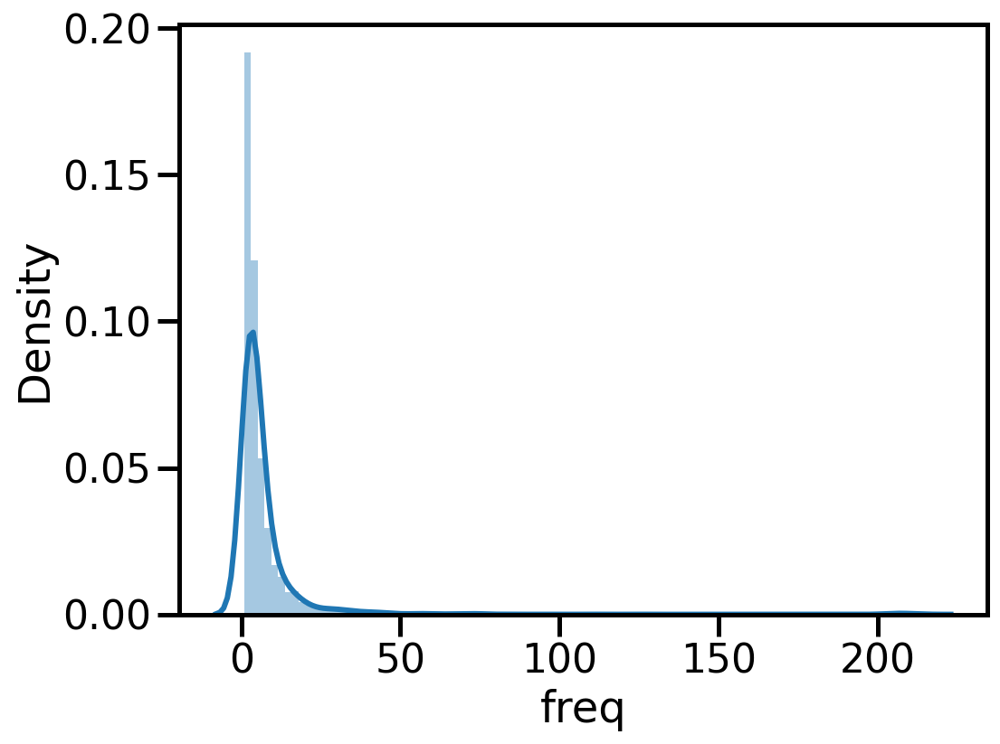

In [34]:
plt.figure(figsize=(8,6))
sns.distplot(dict_df['freq'], bins=100)

In [35]:
dict_df.sort_values('freq', ascending=False).head(10)

,freq
masyarakat,214.277309
kesehatan,212.426722
protokol,210.870923
salah,210.827530
penyebaran,210.533450
kebijakan,209.572025
langkah,207.759293
pencegahan,207.316265
sesuai,206.740891
satunya,206.029159


In [36]:
extension = dict_df[dict_df.freq>213].index.tolist()

In [37]:
extension

['masyarakat']

In [38]:
ids=[dictionary.token2id[extension[i]] for i in range(len(extension))]
dictionary.filter_tokens(bad_ids=ids)

In [39]:
print('Total Vocabulary Size:', len(dictionary))

Total Vocabulary Size: 4018


In [40]:
# Create Corpus: Term Document Frequency
corpus = [dictionary.doc2bow(text) for text in train_komen]

In [41]:
print(len(corpus))
print(corpus[100])
tfidf = models.TfidfModel(corpus) # build TF-IDF model
corpus_tfidf = tfidf[corpus]
corpus_tfidf

9285
[(25, 1), (28, 1), (29, 3), (31, 1), (424, 1), (454, 1), (455, 3), (457, 1), (551, 1), (589, 1), (653, 1), (772, 1), (773, 1), (774, 1), (775, 1), (776, 3), (777, 1), (778, 1), (779, 1)]


In [42]:
#kelompokkan komentar berdasar tanggal
harian = []
for tgl in data_tgl:
    harini = [train_komen[ii] for ii in range(len(datanggal)) if datanggal.iloc[ii]['date'][:10] == tgl]
    harian.append(harini)
    print(len(harini))

703
706
745
809
639
1174
788
761
1171
1789


In [43]:
#number of topics we will cluster for: 5
num_topics = 10

In [44]:
# # LDA
# For LDA, we need to obtain a design matrix. To improve results, I am going to apply TfIdf transformation to the counts.

#the count vectorizer needs string inputs, not array, so I join them with a space.
#train_headlines_sentences = [' '.join(text) for text in train_headlines]
train_headlines_sentens = [[' '.join(text) for text in harini] for harini in harian]
print('\n','train_headlines_sentences',train_headlines_sentens)


 train_headlines_sentences [['Pak DPR pemerintah fokus penanganan covid membahas Cukup corona membahas_Cukup membahas_Cukup membahas_Cukup', 'Defisit Anggaran APBN Pengusaha Muslim Setelah Pemerintah mengumumkan anggaran triliun Maret Juni pemerintah menaikkan triliun peningkatan stimulus Defisit_Anggaran APBN_Pengusaha Muslim_Setelah Defisit_Anggaran APBN_Pengusaha Defisit_Anggaran_APBN_Pengusaha Muslim_Setelah', 'Tapi emg kejadian beneran keluarga gua Adik sepupu gua meninggal karna sakit udh dicek Malah dibungkus covid tes ulang adaan udh meninggal tetep negatif maksa jadiin covid Karena pemerintah', 'Pak Pandemi merenggut nyawa Pemerintah DPR fokus tangani rutin bahas Omnibus Law merenggut_nyawa tangani_rutin bahas_Omnibus tangani_rutin merenggut_nyawa tangani_rutin_bahas_Omnibus', 'Pembagian Masker Face Shield Menuju Adaptasi Kebiasaan Hidup Baru Pasar Templek Kota memutus mata rantai penyebaran Polri TNI Pemerintah Kota Face_Shield Adaptasi_Kebiasaan memutus_mata Adaptasi_Kebias

In [45]:
#get the words as an array for LDA input
lda = ldamodel.LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=num_topics);

In [46]:
def get_lda_topics(model, num_topics):
    word_dict = {}
    for i in range(num_topics):
        words = model.show_topic(i, topn = 10);
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = [i[0] for i in words]
    return pd.DataFrame(word_dict)

In [47]:
get_lda_topics(lda, num_topics)

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10
0,salah,rumah_sakit,Achmad_Yurianto,new_normal,covid,Pemulihan_Ekonomi,Achmad_Yurianto,stimulus_dorong,memutus_mata,covid
1,satunya,covid,Jumlah,tinggal,RUU_HIP,memakai_masker,Gugus_Tugas,terdampak_bertahan,Covid,DKI_Jakarta
2,langkah,mendorong_pertumbuhan,Lampaui_Ketidakmampuan,pasien,Protokol_Kesehatan,kamtibmas_mematuhi,Juru_Bicara,Kabupaten_Gresik,Presiden_Joko,krn
3,physical,Memperhatikan_perkembangan,orang,Pastikan_Perpanjangan,Partai_Gelora,Jawa,Penanganan,adaptasi_kebiasaan,New_Normal,Presiden_Jokowi
4,pencegahan,insentif_pajak,penyakit,sekolah,RUU,sambangi_warga,Pemulihan_Ekonomi,sembuh_meninggal,gugus_tugas,anggaran
5,distancing,percaya,Wakil_Ketua,terkini,Atasi_Dampak,Memerangi_tanggung,ekonomi,Corona,Kabupaten,bahaya
6,bertujuan,gak,Jubir,normal,Adaptasi_Kebiasaan,Surat_Edaran,penanganan,Pandemi,Joko,gak
7,sesuai,sakit,dukung,biaya_pengobatan,penanganan,penanganan,pandemi,positif,covid,kalo
8,menerapkan,vaksin,Bentuk,berjalan,aja,Jatim,Achmad,tangani_rutin,Widodo,mati
9,penggunaan,rumah,Achmad,tim,PEMERINTAH,Ekonomi,perekonomian,merenggut_nyawa,Kota,nggak


In [48]:
def get_lda_topics(lda, n_top_words):
    
    #the word ids obtained need to be reverse-mapped to the words so we can print the topic names.
    feat_names = vectorizer.get_feature_names()
    #print('\n feat names')
    #print(feat_names
    word_dict = {}
    for i in range(num_topics):
        #for each topic, obtain the largest values, and add the words they map to into the dictionary.
        words_ids = model.components_[i].argsort()[:-n_top_words - 1:-1]
        words = [feat_names[key] for key in words_ids]
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = words
        
    return pd.DataFrame(word_dict)

In [49]:
feedback = []
for y, santens in enumerate(train_headlines_sentens):
    # Now, we obtain a Counts design matrix, for which we use SKLearn’s CountVectorizer module. The transformation will return a matrix of size (Documents x Features), where the value of a cell is going to be the number of times the feature (word) appears in that document.
    # To reduce the size of the matrix, to speed up computation, we will set the maximum feature size to 5000, which will take the top 5000 best features that can contribute to our model.
    vectorizer = CountVectorizer(analyzer='word', ngram_range=(2, 3), max_features=5000)
    x_coints = vectorizer.fit_transform(santens)
    transformer = TfidfTransformer(smooth_idf=False)
    x_tfidf = transformer.fit_transform(x_coints)
    xtfidf_norm = normalize(x_tfidf, norm='l1', axis=1)
    model = LatentDirichletAllocation(n_components=num_topics, learning_method='online')
    model.fit(xtfidf_norm)
    toPik = get_lda_topics(lda, 7)
    print('tanggal',data_tgl[y])
    print('\n','konsep matrix \n',toPik)
    feedback.append(toPik)

tanggal 7/15/2020

 konsep matrix 
                         Topic # 01  ...                 Topic # 10
0             pemerintah menangani  ...         pemerintah melawan
1   kebijakan pemerintah menangani  ...   uang insentif dijanjikan
2  polri_mendukung polri_mendukung  ...              uang insentif
3             kebijakan pemerintah  ...            pemerintah cair
4             pemerintah kabupaten  ...    gugus_tugas gugus_tugas
5                       kalo sakit  ...  memutus_mata memutus_mata
6                   dampak pandemi  ...      pemerintah daerah dki

[7 rows x 10 columns]
tanggal 7/2/2020

 konsep matrix 
                             Topic # 01  ...                                         Topic # 10
0     himbauan_kamtibmas ikuti_anjuran  ...              pastikan_perpanjangan bantuan_listrik
1      polres_barsel melaksanakan_giat  ...                     bantuan_listrik stimulus_tepat
2                   pemerintah terkait  ...  pastikan_perpanjangan bantuan_listrik st

In [50]:
model.fit(x_coints)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=10, n_jobs=None,
                          perp_tol=0.1, random_state=None,
                          topic_word_prior=None, total_samples=1000000.0,
                          verbose=0)

In [51]:
x_coints.shape

(1789, 5000)

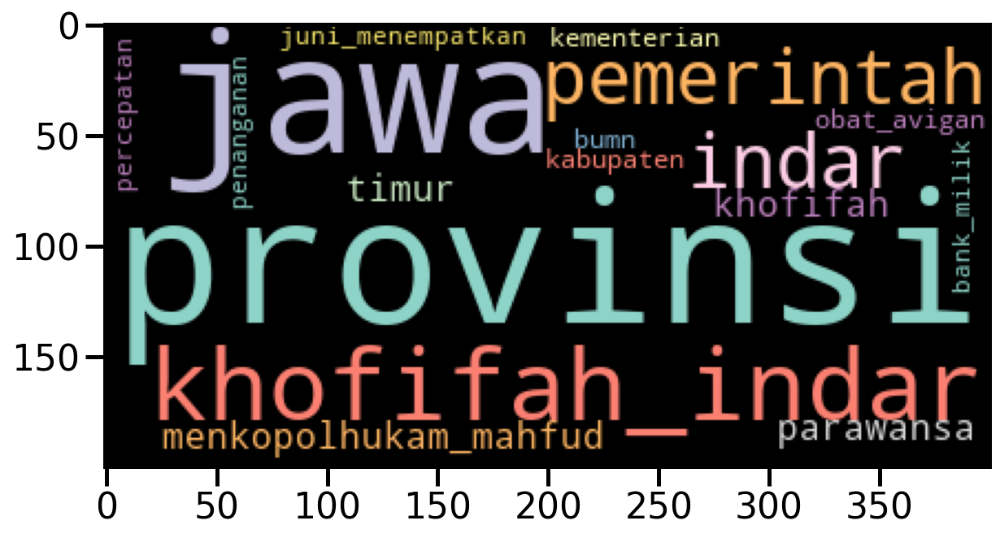

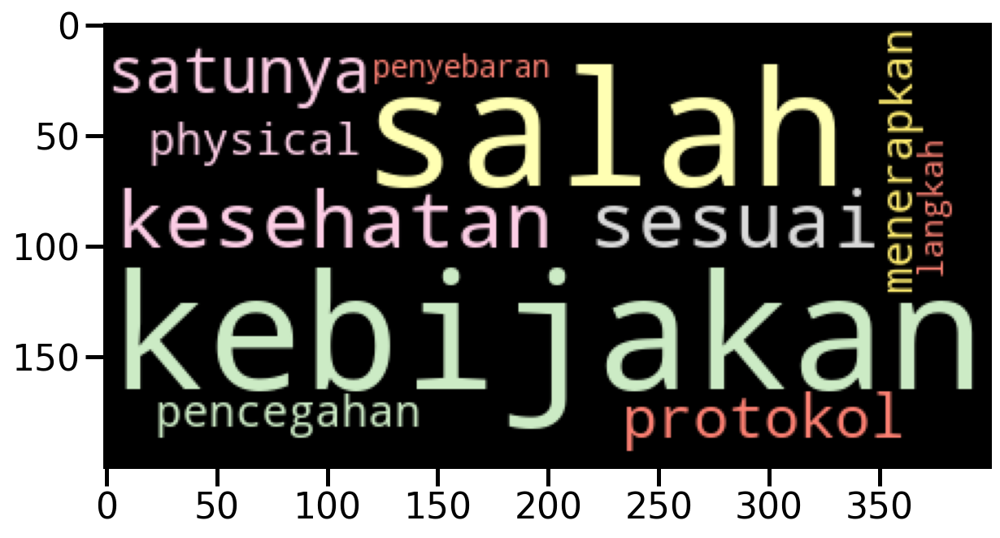

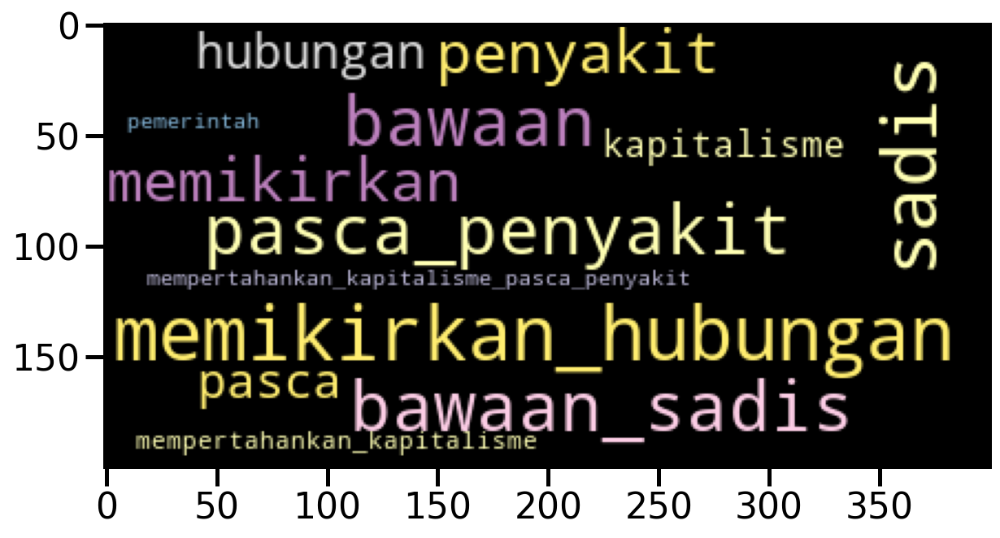

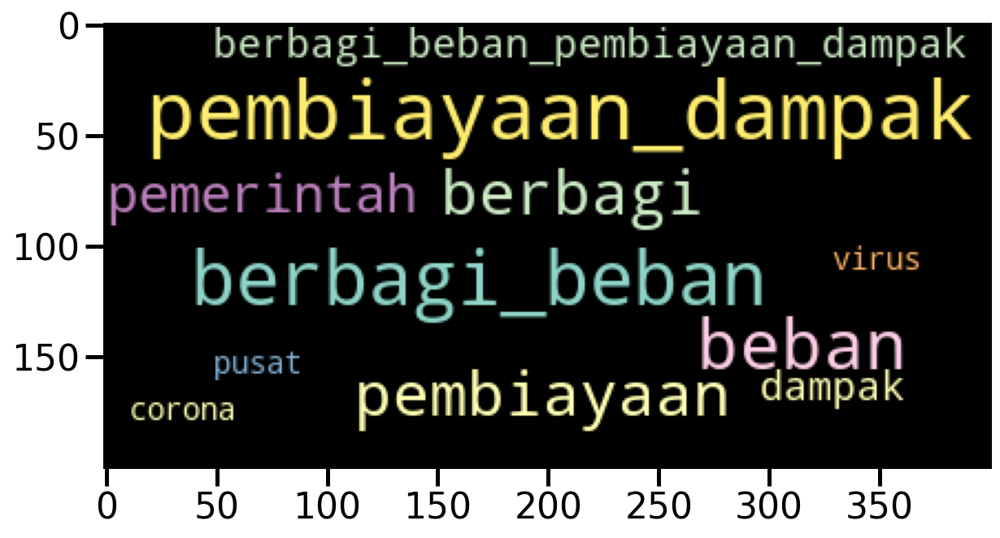

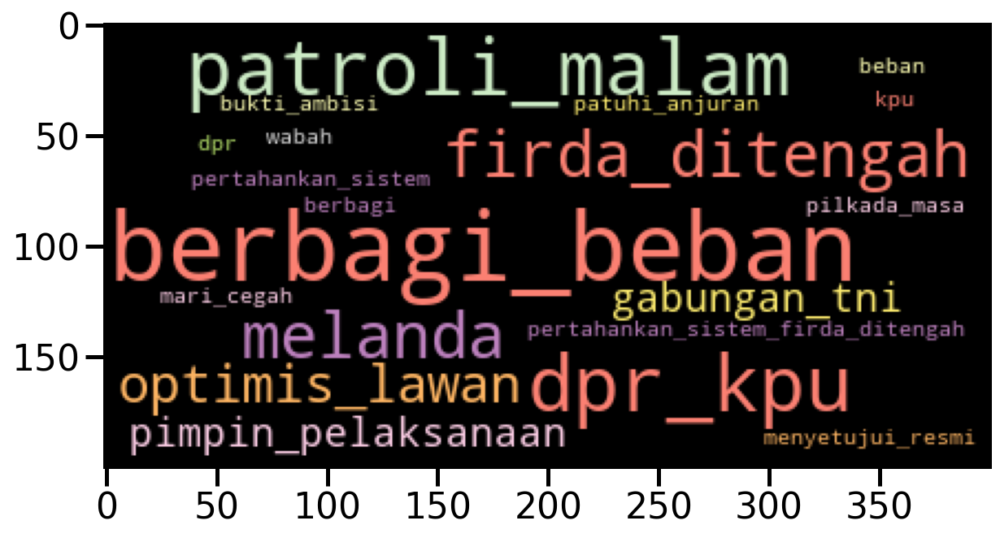

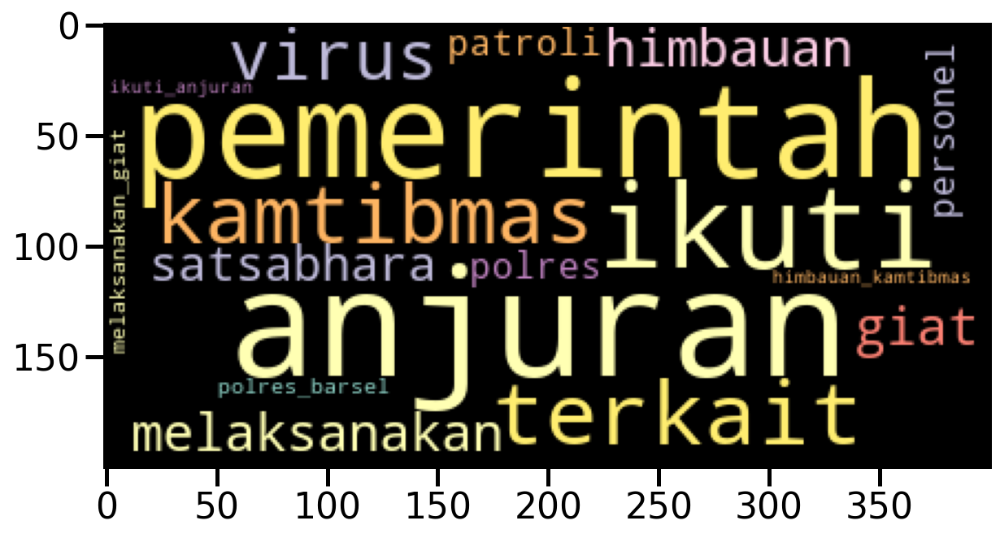

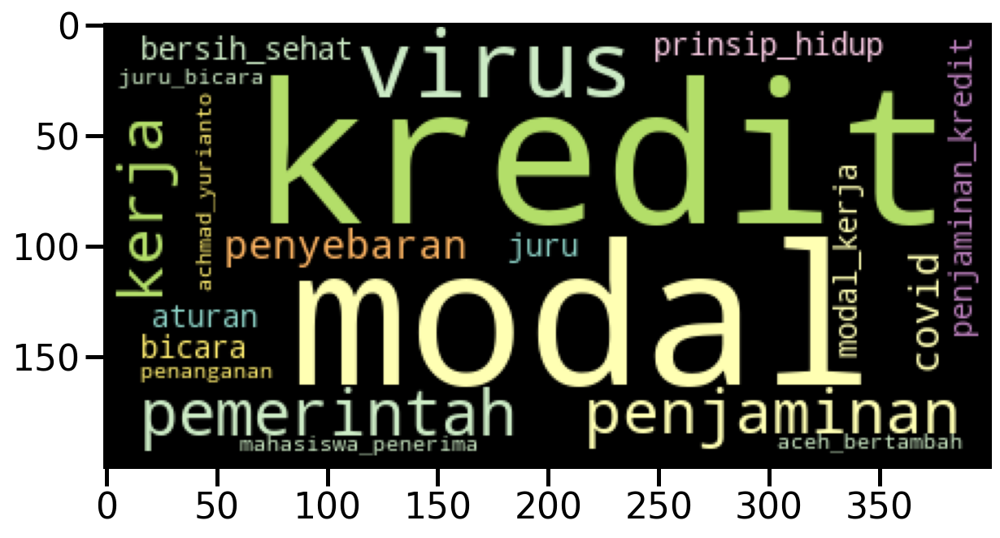

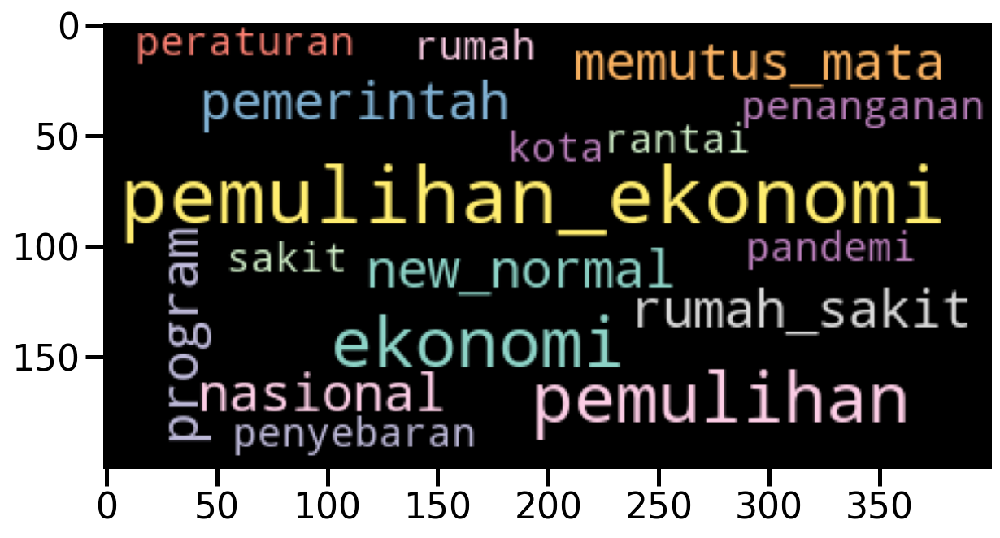

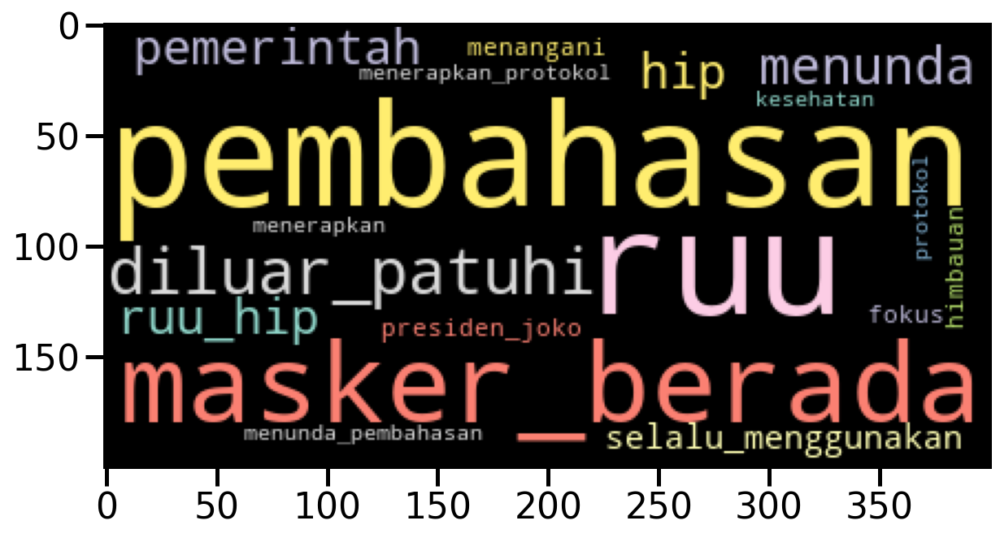

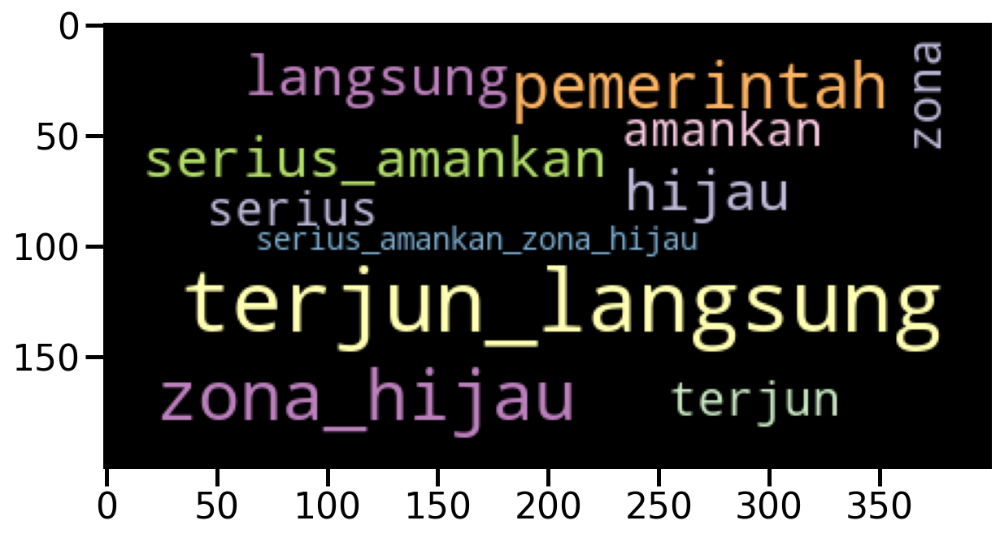

In [52]:
for index, topic in enumerate(model.components_):
    tmps = [vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]]
    teks = " ".join(str(topik) for topik in tmps)
    wcloud = WordCloud(max_words=50, colormap='Set3', background_color='black').generate(teks)
    plt.figure(figsize=(10,5))
    plt.imshow(wcloud)
    plt.show()

In [53]:
topic_model = ldamodel.LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=10, iterations=200) 

In [54]:
# each element of the list is a tuple 
# containing the topic and word / probability list
topics = topic_model.show_topics(num_words = 7, formatted = False)
topics

[(0,
  [('Pemulihan_Ekonomi', 0.03723092),
   ('Gugus_Tugas', 0.02801252),
   ('Ekonomi', 0.015100471),
   ('Pemulihan', 0.013925889),
   ('Penanganan', 0.013079256),
   ('Tugas', 0.010388686),
   ('Gugus', 0.009712263)]),
 (1,
  [('stimulus_dorong', 0.014991808),
   ('terdampak_bertahan', 0.013368879),
   ('covid', 0.0118952105),
   ('gak', 0.008444902),
   ('pasien', 0.008340138),
   ('percaya', 0.0072331694),
   ('uji_klinis', 0.006855974)]),
 (2,
  [('orang', 0.0123319775),
   ('Memerangi_tanggung', 0.010690534),
   ('Vaksin', 0.009916154),
   ('patuhi_Anjuran', 0.009093106),
   ('berupaya_maksimal', 0.008865347),
   ('Komite', 0.008795967),
   ('Lampaui_Ketidakmampuan', 0.008591018)]),
 (3,
  [('satunya', 0.027356764),
   ('penggunaan', 0.026121005),
   ('bertujuan', 0.026095955),
   ('distancing', 0.026060821),
   ('physical', 0.026053824),
   ('salah', 0.025784826),
   ('langkah', 0.025719771)]),
 (4,
  [('covid', 0.00873484),
   ('gugus_tugas', 0.008237165),
   ('Covid', 0.0075

In [55]:
%%time
lda_model = gensim.models.LdaModel(corpus=corpus_tfidf, id2word=dictionary,
                                   chunksize=1740, alpha='auto',
                                   eta='auto', random_state=42,
                                   iterations=500, num_topics=10,
                                   passes=20, eval_every=None)

CPU times: user 43.5 s, sys: 419 ms, total: 44 s
Wall time: 43.6 s


In [56]:
#Viewing the topics in our trained topic model
for topic_id, topic in lda_model.print_topics(num_topics=10, num_words=7):
    print('Topic #'+str(topic_id+1)+':')
    print(topic)
    print()

Topic #1:
0.021*"covid" + 0.017*"pandemi" + 0.014*"penanganan" + 0.010*"ekonomi" + 0.009*"Covid" + 0.009*"Indonesia" + 0.008*"menangani"

Topic #2:
0.026*"RUU_HIP" + 0.017*"RUU" + 0.015*"Surat_Edaran" + 0.013*"HIP" + 0.012*"Pembahasan_RUU" + 0.012*"Manajemen_Krisis" + 0.011*"Aceh_Buat"

Topic #3:
0.017*"Memerangi_tanggung" + 0.012*"mendorong_pertumbuhan" + 0.011*"Memperhatikan_perkembangan" + 0.010*"tanggung" + 0.009*"Paguyuban_Rakyat" + 0.009*"mendorong" + 0.009*"nggak"

Topic #4:
0.020*"pasien" + 0.015*"orang" + 0.015*"positif" + 0.012*"rumah_sakit" + 0.010*"percaya" + 0.010*"data" + 0.008*"Jatim"

Topic #5:
0.030*"Gugus_Tugas" + 0.028*"Achmad_Yurianto" + 0.023*"Juru_Bicara" + 0.012*"Gugus" + 0.011*"Tugas" + 0.011*"melaksanakan_giat" + 0.011*"Achmad"

Topic #6:
0.043*"salah" + 0.043*"pencegahan" + 0.043*"sesuai" + 0.042*"menerapkan" + 0.042*"langkah" + 0.042*"satunya" + 0.041*"protokol"

Topic #7:
0.012*"DKI_Jakarta" + 0.010*"tangani_rutin" + 0.010*"merenggut_nyawa" + 0.009*"patuhi_A

In [57]:
#viewing the overall mean coherence score of the model
topics_coherences = lda_model.top_topics(corpus_tfidf, topn=20)
avg_coherence_score = np.mean([item[1] for item in topics_coherences])
print('Avg. Coherence Score:', avg_coherence_score)

Avg. Coherence Score: -14.298885046938429


In [58]:
#looking at the output of our LDA topic model
topics_with_wts = [item[0] for item in topics_coherences]
print('LDA Topics with Weights')
print('='*50)
for idx, topic in enumerate(topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([(term, round(wt, 3)) for wt, term in topic])
    print()

LDA Topics with Weights
Topic #1:
[('covid', 0.021), ('pandemi', 0.017), ('penanganan', 0.014), ('ekonomi', 0.01), ('Covid', 0.009), ('Indonesia', 0.009), ('menangani', 0.008), ('aja', 0.008), ('Pandemi', 0.007), ('upaya', 0.007), ('dampak', 0.006), ('virus', 0.006), ('vaksin', 0.006), ('anggaran', 0.006), ('bantuan', 0.006), ('terdampak', 0.006), ('gak', 0.005), ('warga', 0.005), ('membantu', 0.005), ('kalo', 0.005)]

Topic #2:
[('salah', 0.043), ('pencegahan', 0.043), ('sesuai', 0.043), ('menerapkan', 0.042), ('langkah', 0.042), ('satunya', 0.042), ('protokol', 0.041), ('penggunaan', 0.041), ('distancing', 0.041), ('bertujuan', 0.041), ('physical', 0.041), ('Menghimbau', 0.04), ('kesehatan', 0.038), ('kebijakan', 0.038), ('penyebaran', 0.036), ('memakai_masker', 0.017), ('kamtibmas_mematuhi', 0.014), ('sambangi_warga', 0.009), ('memakai', 0.006), ('disiplin', 0.006)]

Topic #3:
[('pasien', 0.02), ('orang', 0.015), ('positif', 0.015), ('rumah_sakit', 0.012), ('percaya', 0.01), ('data'

In [59]:
model = LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=10)
for idx, topic in model.print_topics():
    print('Topic: ({}) word: {}'.format(idx, topic))

Topic: (0) word: 0.009*"Protokol_Kesehatan" + 0.009*"covid" + 0.008*"gugus_tugas" + 0.007*"pasien" + 0.007*"percaya" + 0.007*"Partai_Gelora" + 0.007*"orang" + 0.007*"gak" + 0.006*"Jumlah" + 0.006*"Atasi_Dampak"
Topic: (1) word: 0.024*"Pemulihan_Ekonomi" + 0.016*"Gugus_Tugas" + 0.015*"rumah_sakit" + 0.010*"Ekonomi" + 0.008*"Pemulihan" + 0.008*"ekonomi" + 0.008*"penanganan" + 0.008*"DKI_Jakarta" + 0.007*"Penanganan" + 0.006*"Nasional"
Topic: (2) word: 0.010*"adaptasi_kebiasaan" + 0.009*"Jawa" + 0.009*"covid" + 0.009*"insentif_pajak" + 0.007*"bantuan" + 0.006*"Provinsi" + 0.006*"penanganan" + 0.005*"kalo" + 0.005*"patuhi_Anjuran" + 0.005*"dorong"
Topic: (3) word: 0.017*"stimulus_dorong" + 0.015*"terdampak_bertahan" + 0.008*"orang" + 0.008*"tangani_rutin" + 0.008*"merenggut_nyawa" + 0.007*"covid" + 0.006*"nggak" + 0.006*"Pandemi" + 0.006*"aja" + 0.006*"teori_konspirasi"
Topic: (4) word: 0.032*"Achmad_Yurianto" + 0.020*"Juru_Bicara" + 0.012*"Achmad" + 0.011*"Yurianto" + 0.011*"mendorong_per

In [60]:
#viewing the topics as a list of terms without the weights
print('LDA Topics without Weights')
print('='*50)
for idx, topic in enumerate(topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([term for wt, term in topic])
    print()

LDA Topics without Weights
Topic #1:
['covid', 'pandemi', 'penanganan', 'ekonomi', 'Covid', 'Indonesia', 'menangani', 'aja', 'Pandemi', 'upaya', 'dampak', 'virus', 'vaksin', 'anggaran', 'bantuan', 'terdampak', 'gak', 'warga', 'membantu', 'kalo']

Topic #2:
['salah', 'pencegahan', 'sesuai', 'menerapkan', 'langkah', 'satunya', 'protokol', 'penggunaan', 'distancing', 'bertujuan', 'physical', 'Menghimbau', 'kesehatan', 'kebijakan', 'penyebaran', 'memakai_masker', 'kamtibmas_mematuhi', 'sambangi_warga', 'memakai', 'disiplin']

Topic #3:
['pasien', 'orang', 'positif', 'rumah_sakit', 'percaya', 'data', 'Jatim', 'Kasus', 'angka', 'Ini', 'Kabupaten_Gresik', 'Jawa', 'rumah', 'sakit', 'kena', 'krn', 'Lampaui_Ketidakmampuan', 'tes', 'Corona', 'mempercepat']

Topic #4:
['Gugus_Tugas', 'Achmad_Yurianto', 'Juru_Bicara', 'Gugus', 'Tugas', 'melaksanakan_giat', 'Achmad', 'Yurianto', 'Penanganan', 'ikuti_anjuran', 'Juru', 'Jawa', 'diterima_langsung', 'Provinsi', 'Bantuan_alat', 'Bicara', 'himbauan_Kamtib

In [61]:
umass_coherence_model_lda = gensim.models.CoherenceModel(model=lda_model,
                                                         corpus=corpus_tfidf,
                                                         texts=train_komen,
                                                         dictionary=dictionary,
                                                         coherence='u_mass')
avg_coherence_umass = umass_coherence_model_lda.get_coherence()

perplexity = lda_model.log_perplexity(corpus_tfidf)

print('Avg. Coherence Score (UMass):', avg_coherence_umass)
print('Model Perplexity:', perplexity)

Avg. Coherence Score (UMass): -14.298885046938429
Model Perplexity: -8.318418480867477


In [62]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel( corpus=corpus_tfidf, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=lda_model, texts=train_komen, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [63]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus_tfidf, texts=train_komen, start=2, limit=40, step=6)

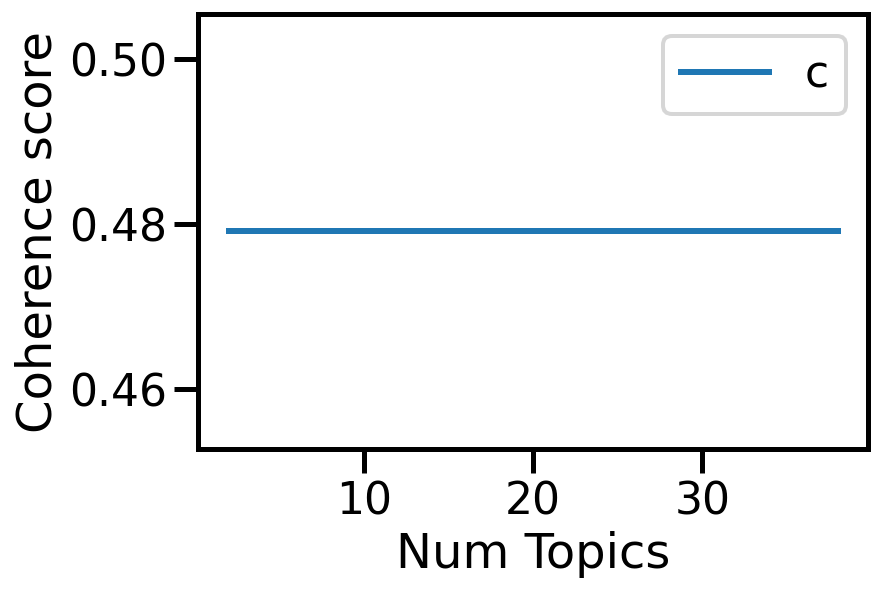

In [64]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [65]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 7))

Num Topics = 2  has Coherence Value of 0.4791057
Num Topics = 8  has Coherence Value of 0.4791057
Num Topics = 14  has Coherence Value of 0.4791057
Num Topics = 20  has Coherence Value of 0.4791057
Num Topics = 26  has Coherence Value of 0.4791057
Num Topics = 32  has Coherence Value of 0.4791057
Num Topics = 38  has Coherence Value of 0.4791057


In [66]:
#LDA_viz = pyLDAvis.gensim_models.prepare(lda_model, corpus_tfidf, dictionary)
#pyLDAvis.save_html(LDA_viz, "E:/dataset/LDA.html")

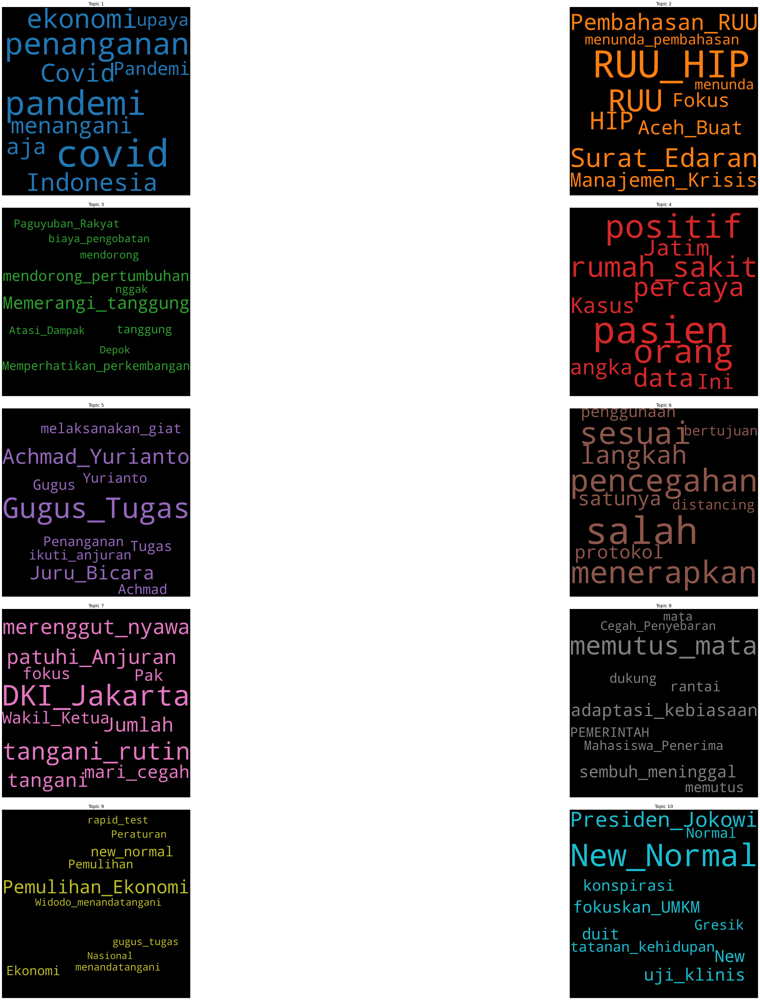

In [67]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cloud = WordCloud(stopwords=STOPWORDS,
                  background_color='black',
                  width=2500,
                  height=2500,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)


topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(5, 2, figsize=(80,50), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=500)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i+1), fontdict=dict(size=16))
    plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [68]:
def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

df_topic_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus_tfidf, texts=train_komen)

In [69]:
# Format
df_dominant_topic = df_topic_keywords.reset_index()
df_dominant_topic.columns = ['date', 'Dominant_Topic', 'Topic_Perc_Contrib','keywords', 'title']
df_dominant_topic.date = data.date

# Show
df_dominant_topic.head(10)

,date,Dominant_Topic,Topic_Perc_Contrib,keywords,title
0,7/7/2020,7.0,0.3083,"memutus_mata, adaptasi_kebiasaan, sembuh_menin...","[Sandiaga, Uno, For, Jokowi, berkomitmen, memb..."
1,7/7/2020,0.0,0.3352,"covid, pandemi, penanganan, ekonomi, Covid, In...","[Pemerintah, Jawa, Timur, Kolaborasi, Kedutaan..."
2,7/7/2020,0.0,0.2712,"covid, pandemi, penanganan, ekonomi, Covid, In...","[Anggota, Komisi, DPR, Andi, Akmal, Pasluddin,..."
3,7/7/2020,4.0,0.3418,"Gugus_Tugas, Achmad_Yurianto, Juru_Bicara, Gug...","[Kota, Juang, terkonfirmasi, positif, terinfek..."
4,7/7/2020,3.0,0.2871,"pasien, orang, positif, rumah_sakit, percaya, ...","[Meski, Kembali, Zona, Kuning, Pemkot, Klaim, ..."
5,7/7/2020,0.0,0.2057,"covid, pandemi, penanganan, ekonomi, Covid, In...","[kesadaran, masyarakat, rendah, salah, atu, pe..."
6,7/7/2020,0.0,0.4511,"covid, pandemi, penanganan, ekonomi, Covid, In...","[Bagaimana, angka, kematian, penularan, covid,..."
7,7/7/2020,6.0,0.5595,"DKI_Jakarta, tangani_rutin, merenggut_nyawa, p...","[Pak, Pandemi, merenggut, nyawa, Pemerintah, D..."
8,7/7/2020,0.0,0.3826,"covid, pandemi, penanganan, ekonomi, Covid, In...","[wkwkwk, kayaknya, konspirasi, covid, tau, klo..."
9,7/7/2020,2.0,0.2779,"Memerangi_tanggung, mendorong_pertumbuhan, Mem...","[pemerintah, gitu, bikin, event, offline, even..."


In [70]:
df_topics_keyword_sorted = pd.DataFrame()

df_topics_keyword_sorted_grouped = df_topic_keywords.groupby('Dominant_Topic')

for i, grp in df_topics_keyword_sorted_grouped:
    df_topics_keyword_sorted = pd.concat([df_topics_keyword_sorted, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
df_topics_keyword_sorted.reset_index(drop=True, inplace=True)

# Format
df_topics_keyword_sorted.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
df_topics_keyword_sorted.head()

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.6936,"covid, pandemi, penanganan, ekonomi, Covid, In...","[HIMBAUAN, rutin, Personel, Polsek, Gunung, Me..."
1,1.0,0.6324,"RUU_HIP, RUU, Surat_Edaran, HIP, Pembahasan_RU...","[Satgas, Aman, Nusa, Satuan, Brimob, Polda, Ke..."
2,2.0,0.5203,"Memerangi_tanggung, mendorong_pertumbuhan, Mem...","[Memerangi, tanggung, pemerintah, tanggung, pa..."
3,3.0,0.5902,"pasien, orang, positif, rumah_sakit, percaya, ...","[Komunitas, Bike, Work, menanggapi, positif, f..."
4,4.0,0.6516,"Gugus_Tugas, Achmad_Yurianto, Juru_Bicara, Gug...","[Personel, Satsabhara, Polres, Barsel, melaksa..."


In [71]:
temp_list = [] # A temp variable for us to form a dataframe

for x in range(df_dominant_topic.shape[0]): # For all the documents
    new_doc = train_komen[x] # Get the content of document (already preprocessed)
    new_doc_bow = dictionary.doc2bow(new_doc) # Form a BOW
    temp = lda_model.get_document_topics(new_doc_bow, minimum_probability=0.0) # Get the doc-topic dist
    temp_list.append([round(n,5) for _, n in temp]) # Add in all the probabilities

# Create Dataframe for our probabilities
doc_topic_df_prob = pd.DataFrame(temp_list)

# Get a copy of the original table containing document and their contents
df_original_copy = df_dominant_topic

# Merge the 2 dataframe together
doc_topic_table = pd.concat([df_original_copy, doc_topic_df_prob], axis=1)

# Remove certain rows for a more concise table
doc_topic_table = doc_topic_table[[col for col in doc_topic_table.columns if col not in 
                                       ['Dominant_Topic','Topic_Perc_Contrib','title']]]
# Renaming columns
doc_topic_table.rename(columns={0: "Topic 1", 1: "Topic 2", 2: "Topic 3", 3: "Topic 4", 4: "Topic 5", 5: "Topic 6", 6: "Topic 7", 7: "Topic 8", 8: "Topic 9", 9: "Topic 10"},
                       inplace=True)
# Display the table
doc_topic_table

,date,keywords,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
0,7/7/2020,"memutus_mata, adaptasi_kebiasaan, sembuh_menin...",0.19945,0.01227,0.00982,0.03659,0.01678,0.01748,0.01618,0.49002,0.07700,0.12441
1,7/7/2020,"covid, pandemi, penanganan, ekonomi, Covid, In...",0.29127,0.02748,0.02205,0.45266,0.04563,0.03558,0.03592,0.03046,0.02514,0.03381
2,7/7/2020,"covid, pandemi, penanganan, ekonomi, Covid, In...",0.31817,0.01313,0.01046,0.03796,0.01806,0.01716,0.01930,0.01468,0.35398,0.19710
3,7/7/2020,"Gugus_Tugas, Achmad_Yurianto, Juru_Bicara, Gug...",0.12763,0.00850,0.00685,0.27173,0.53515,0.01106,0.01122,0.00952,0.00782,0.01051
4,7/7/2020,"pasien, orang, positif, rumah_sakit, percaya, ...",0.03998,0.10728,0.00664,0.38178,0.03816,0.06848,0.01088,0.00908,0.22474,0.11298
...,...,...,...,...,...,...,...,...,...,...,...,...
9280,7/20/2020,"DKI_Jakarta, tangani_rutin, merenggut_nyawa, p...",0.07630,0.00491,0.00396,0.01447,0.00684,0.00674,0.83832,0.03787,0.00451,0.00607
9281,7/20/2020,"RUU_HIP, RUU, Surat_Edaran, HIP, Pembahasan_RU...",0.08456,0.26930,0.01423,0.21283,0.13480,0.02289,0.11298,0.01963,0.10700,0.02177
9282,7/20/2020,"covid, pandemi, penanganan, ekonomi, Covid, In...",0.31968,0.08426,0.08159,0.11337,0.01904,0.10702,0.01823,0.08569,0.01276,0.15836
9283,7/20/2020,"covid, pandemi, penanganan, ekonomi, Covid, In...",0.14938,0.01245,0.00982,0.14984,0.01683,0.01754,0.31677,0.30060,0.01161,0.01516


In [72]:
order = [i for i in df_topics_keyword_sorted.Keywords]
order

['covid, pandemi, penanganan, ekonomi, Covid, Indonesia, menangani, aja, Pandemi, upaya',
 'RUU_HIP, RUU, Surat_Edaran, HIP, Pembahasan_RUU, Manajemen_Krisis, Aceh_Buat, Fokus, menunda_pembahasan, menunda',
 'Memerangi_tanggung, mendorong_pertumbuhan, Memperhatikan_perkembangan, tanggung, Paguyuban_Rakyat, mendorong, nggak, Atasi_Dampak, biaya_pengobatan, Depok',
 'pasien, orang, positif, rumah_sakit, percaya, data, Jatim, Kasus, angka, Ini',
 'Gugus_Tugas, Achmad_Yurianto, Juru_Bicara, Gugus, Tugas, melaksanakan_giat, Achmad, Yurianto, Penanganan, ikuti_anjuran',
 'salah, pencegahan, sesuai, menerapkan, langkah, satunya, protokol, penggunaan, distancing, bertujuan',
 'DKI_Jakarta, tangani_rutin, merenggut_nyawa, patuhi_Anjuran, Jumlah, tangani, mari_cegah, Wakil_Ketua, fokus, Pak',
 'memutus_mata, adaptasi_kebiasaan, sembuh_meninggal, rantai, memutus, PEMERINTAH, dukung, Mahasiswa_Penerima, mata, Cegah_Penyebaran',
 'Pemulihan_Ekonomi, new_normal, Ekonomi, Pemulihan, Peraturan, menand

In [73]:
list_of_docs = []
for i in range(1,11):
    temp = doc_topic_table[['date','keywords','Topic %s' %i]]
    temp.rename(columns={'Topic %s' %i: "share"}, inplace = True)
    list_of_docs.append(temp)
df = pd.concat(list_of_docs)
df.keywords = [i for i in order for j in range(9285)]
df.rename(columns={'keywords': 'topic_keywords','Document_No': 'date'}, inplace=True)

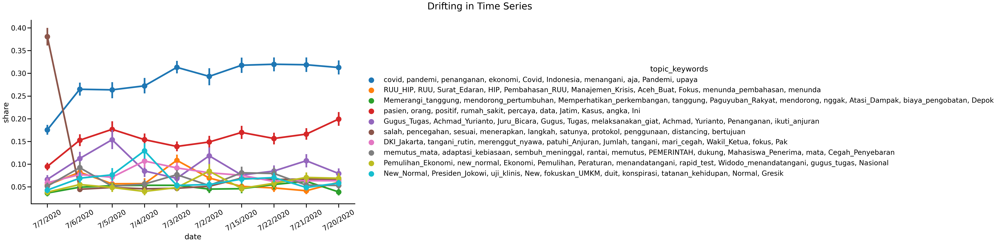

In [74]:
p = sns.factorplot(x="date", y='share', kind='point', hue_order=order, hue='topic_keywords',size=10, aspect=1.8, data=df)
p.fig.subplots_adjust(top=0.9)
p.fig.suptitle('Drifting in Time Series', fontsize=30)
p.set_xticklabels(rotation=30)
p

In [75]:
#df.to_csv('E:/dataset/new_covid19_sentiment.csv')

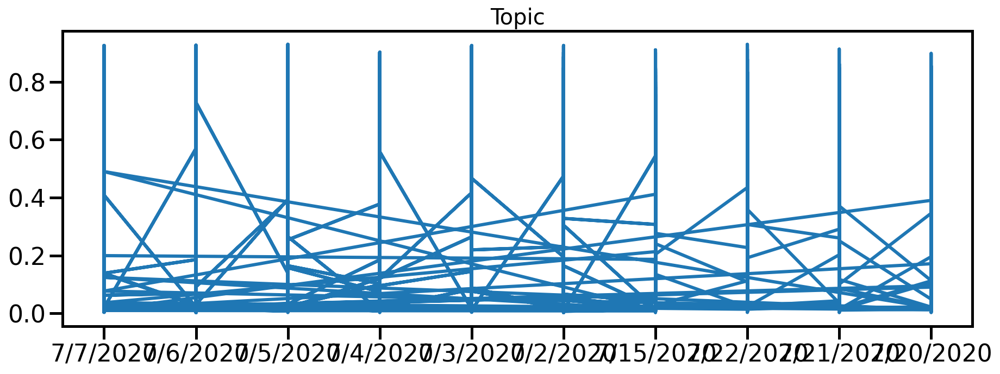

In [76]:
dates = df['date'].values
temp  = df['share'].values
 
plt.figure(figsize=(15,5))
plt.plot(dates, temp)
plt.title('Topic',
          fontsize=20);

In [77]:
from sklearn.model_selection import train_test_split
dates_train, dates_test, label_train, label_test = train_test_split(dates, temp, test_size=0.2)

In [78]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
 
tokenizer = Tokenizer(num_words=5000, oov_token='x')
tokenizer.fit_on_texts(dates_train) 
tokenizer.fit_on_texts(dates_test)
 
sekuens_latih = tokenizer.texts_to_sequences(dates_train)
sekuens_test = tokenizer.texts_to_sequences(dates_test)
 
padded_latih = pad_sequences(sekuens_latih) 
padded_test = pad_sequences(sekuens_test)

In [79]:
def windowed_dataset(series, window_size, batch_size, shuffle_buffer):
    series = tf.expand_dims(series, axis=-1)
    ds = tf.data.Dataset.from_tensor_slices(series)
    ds = ds.window(window_size + 1, shift=1, drop_remainder=True)
    ds = ds.flat_map(lambda w: w.batch(window_size + 1))
    ds = ds.shuffle(shuffle_buffer)
    ds = ds.map(lambda w: (w[:-1], w[-1:]))
    return ds.batch(batch_size).prefetch(1)

In [80]:
test_set = windowed_dataset(label_test, window_size=60, batch_size=100, shuffle_buffer=1000)
model = tf.keras.models.Sequential([
  tf.keras.layers.LSTM(60, return_sequences=True),
  tf.keras.layers.LSTM(60),
  tf.keras.layers.Dense(30, activation="relu"),
  tf.keras.layers.Dense(10, activation="relu"),
  tf.keras.layers.Dense(1),
])

In [81]:
optimizer = tf.keras.optimizers.SGD(lr=1.0000e-04, momentum=0.9)
model.compile(loss=tf.keras.losses.Huber(),
              optimizer=optimizer,
              metrics=["mse"])
history = model.fit(test_set,epochs=30)

Epoch 1/30
186/186 [==============================] - 24s 106ms/step - loss: 0.0187 - mse: 0.0374
Epoch 2/30
186/186 [==============================] - 20s 106ms/step - loss: 0.0170 - mse: 0.0340
Epoch 3/30
186/186 [==============================] - 20s 107ms/step - loss: 0.0163 - mse: 0.0326
Epoch 4/30
186/186 [==============================] - 20s 107ms/step - loss: 0.0160 - mse: 0.0319
Epoch 5/30
186/186 [==============================] - 20s 104ms/step - loss: 0.0158 - mse: 0.0316
Epoch 6/30
186/186 [==============================] - 20s 106ms/step - loss: 0.0157 - mse: 0.0315
Epoch 7/30
186/186 [==============================] - 20s 108ms/step - loss: 0.0157 - mse: 0.0314
Epoch 8/30
186/186 [==============================] - 20s 108ms/step - loss: 0.0157 - mse: 0.0314
Epoch 9/30
186/186 [==============================] - 20s 105ms/step - loss: 0.0157 - mse: 0.0314
Epoch 10/30
186/186 [==============================] - 19s 103ms/step - loss: 0.0157 - mse: 0.0314
Epoch 11/30
186/186

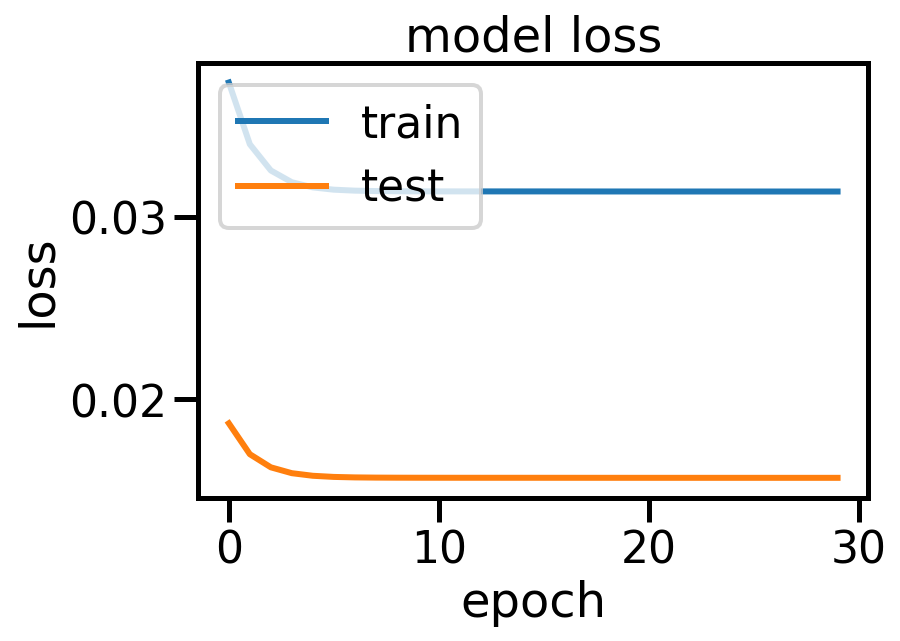

In [82]:
# visualisasi loss plot
plt.plot(history.history['mse'])
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()